In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split


from sklearn.decomposition import PCA


from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor


from datetime import datetime, timedelta
import plotly.express as px


In [3]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM,Activation, Embedding,Bidirectional,Conv1D, MaxPooling1D
from keras.optimizers import Adam
from keras.metrics import categorical_crossentropy
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import keras.backend as kb



In [4]:


train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

train.head(5)

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
0,ID_-0.510_29.290_2019_00,-0.51,29.29,2019,0,-0.000108,0.603019,-0.000065,0.255668,-98.593887,...,3664.436218,61085.809570,2615.120483,15.568533,0.272292,-12.628986,35.632416,-138.786423,30.752140,3.750994
1,ID_-0.510_29.290_2019_01,-0.51,29.29,2019,1,0.000021,0.728214,0.000014,0.130988,16.592861,...,3651.190311,66969.478735,3174.572424,8.690601,0.256830,30.359375,39.557633,-145.183930,27.251779,4.025176
2,ID_-0.510_29.290_2019_02,-0.51,29.29,2019,2,0.000514,0.748199,0.000385,0.110018,72.795837,...,4216.986492,60068.894448,3516.282669,21.103410,0.251101,15.377883,30.401823,-142.519545,26.193296,4.231381
3,ID_-0.510_29.290_2019_03,-0.51,29.29,2019,3,NaN,NaN,NaN,NaN,NaN,...,5228.507736,51064.547339,4180.973322,15.386899,0.262043,-11.293399,24.380357,-132.665828,28.829155,4.305286
4,ID_-0.510_29.290_2019_04,-0.51,29.29,2019,4,-0.000079,0.676296,-0.000048,0.121164,4.121269,...,3980.598120,63751.125781,3355.710107,8.114694,0.235847,38.532263,37.392979,-141.509805,22.204612,4.347317


In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79023 entries, 0 to 79022
Data columns (total 76 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   ID_LAT_LON_YEAR_WEEK                                      79023 non-null  object 
 1   latitude                                                  79023 non-null  float64
 2   longitude                                                 79023 non-null  float64
 3   year                                                      79023 non-null  int64  
 4   week_no                                                   79023 non-null  int64  
 5   SulphurDioxide_SO2_column_number_density                  64414 non-null  float64
 6   SulphurDioxide_SO2_column_number_density_amf              64414 non-null  float64
 7   SulphurDioxide_SO2_slant_column_number_density            64414 non-null  float64
 8   SulphurDioxide_c

In [6]:
train.describe().T.style.bar()


,count,mean,std,min,25%,50%,75%,max
latitude,79023.000000,-1.891072,0.694522,-3.299000,-2.451000,-1.882000,-1.303000,-0.510000
longitude,79023.000000,29.880155,0.810375,28.228000,29.262000,29.883000,30.471000,31.532000
year,79023.000000,2020.000000,0.816502,2019.000000,2019.000000,2020.000000,2021.000000,2021.000000
week_no,79023.000000,26.000000,15.297155,0.000000,13.000000,26.000000,39.000000,52.000000
SulphurDioxide_SO2_column_number_density,64414.000000,0.000048,0.000272,-0.000996,-0.000096,0.000024,0.000153,0.004191
SulphurDioxide_SO2_column_number_density_amf,64414.000000,0.834848,0.185382,0.241822,0.705817,0.809118,0.942792,1.885239
SulphurDioxide_SO2_slant_column_number_density,64414.000000,0.000035,0.000206,-0.000887,-0.000078,0.000019,0.000121,0.004236
SulphurDioxide_cloud_fraction,64414.000000,0.158418,0.071364,0.000000,0.110535,0.161855,0.211824,0.299998
SulphurDioxide_sensor_azimuth_angle,64414.000000,-7.925870,64.263368,-179.537059,-56.782383,-12.441726,72.059990,122.095200
SulphurDioxide_sensor_zenith_angle,64414.000000,37.436189,14.149950,0.099237,28.844520,37.784299,47.634875,66.242012


In [7]:
test.describe().T.style.bar()

,count,mean,std,min,25%,50%,75%,max
latitude,24353.000000,-1.891072,0.694532,-3.299000,-2.451000,-1.882000,-1.303000,-0.510000
longitude,24353.000000,29.880155,0.810387,28.228000,29.262000,29.883000,30.471000,31.532000
year,24353.000000,2022.000000,0.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000
week_no,24353.000000,24.000000,14.142426,0.000000,12.000000,24.000000,36.000000,48.000000
SulphurDioxide_SO2_column_number_density,18211.000000,0.000014,0.000234,-0.000977,-0.000122,0.000007,0.000137,0.004110
SulphurDioxide_SO2_column_number_density_amf,18211.000000,0.792570,0.168043,0.339845,0.678384,0.763307,0.872586,1.696826
SulphurDioxide_SO2_slant_column_number_density,18211.000000,0.000009,0.000170,-0.000775,-0.000094,0.000004,0.000104,0.002701
SulphurDioxide_cloud_fraction,18211.000000,0.139218,0.079865,0.000000,0.078934,0.138999,0.200819,0.299973
SulphurDioxide_sensor_azimuth_angle,18211.000000,9.298052,67.148199,-106.809900,-41.627297,16.857963,73.664560,157.503026
SulphurDioxide_sensor_zenith_angle,18211.000000,36.174307,14.156478,0.099606,26.577654,37.310447,45.972595,66.243271


In [8]:
def Drop_col(data):
    columns = ["UvAerosolLayerHeight_aerosol_height", "UvAerosolLayerHeight_aerosol_pressure", "UvAerosolLayerHeight_aerosol_optical_depth",
               "UvAerosolLayerHeight_sensor_zenith_angle", "UvAerosolLayerHeight_sensor_azimuth_angle", "UvAerosolLayerHeight_solar_azimuth_angle",
               "UvAerosolLayerHeight_solar_zenith_angle", "ID_LAT_LON_YEAR_WEEK"]
    for col in columns:
        data.drop(columns=col, axis=1, inplace=True)
    return data

train = Drop_col(train)
test = Drop_col(test)


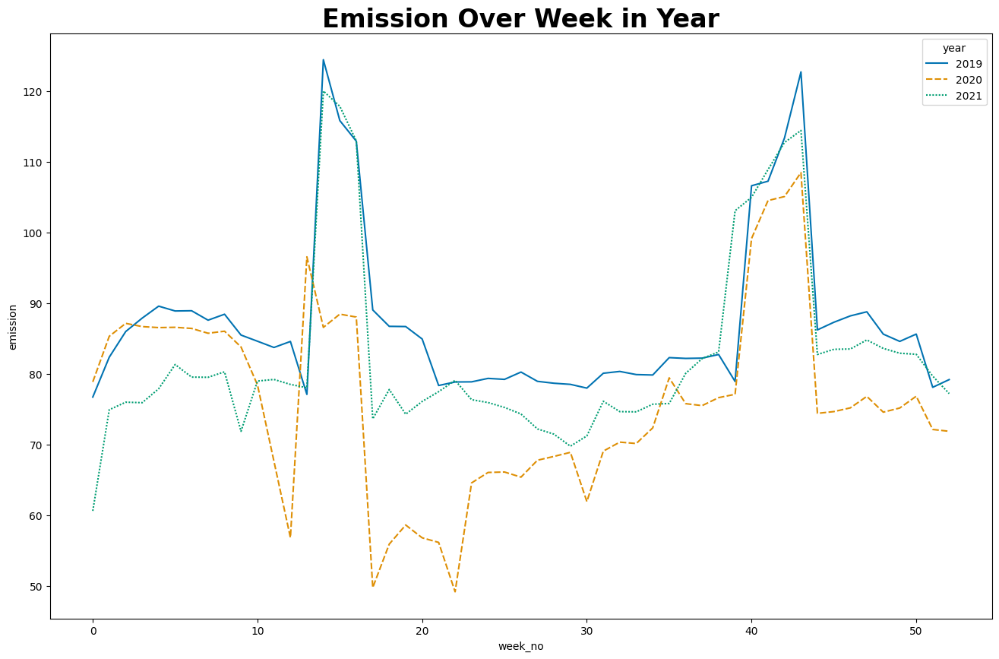

In [9]:
plt.figure(figsize= (16,10))
sns.lineplot(data = train, x = 'week_no', y = 'emission', hue = 'year', errorbar = None, palette= 'colorblind', style='year')  
plt.title('Emission Over Week in Year', fontsize = 24, fontweight = 'bold')
plt.show()

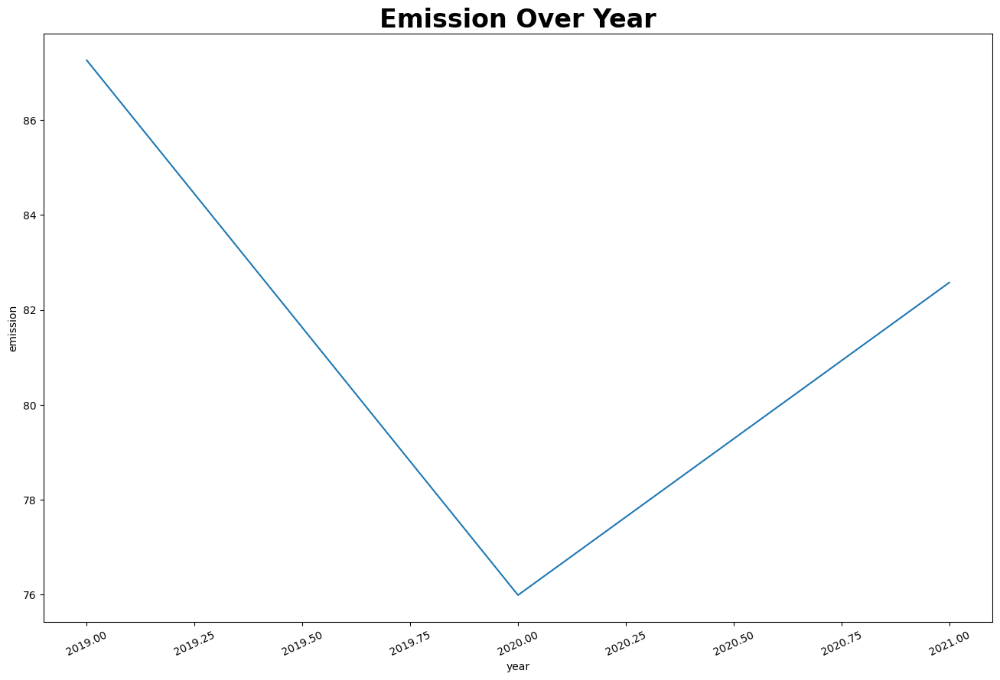

In [10]:
plt.figure(figsize= (16,10))
sns.lineplot(data = train, x = 'year', y = 'emission', errorbar = None)
plt.title('Emission Over Year', fontsize = 24, fontweight = 'bold')
plt.xticks(rotation = 25)
plt.show()

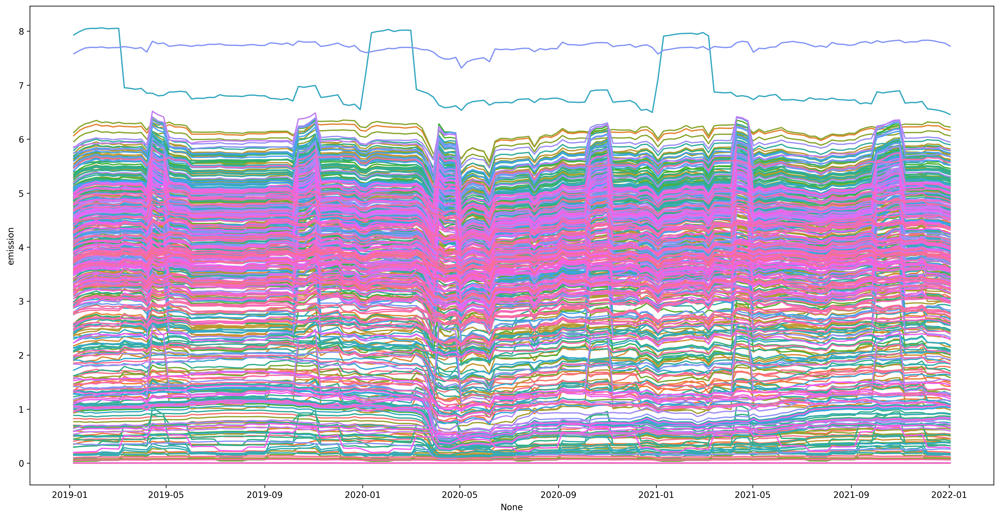

In [11]:
year_week = pd.to_datetime((train.year * 100 + train.week_no).astype('str') + '0' , format='%Y%W%w')
plt.figure(figsize=(20 , 10) , dpi = 300)
sns.lineplot(x = year_week , y = np.log1p(train.emission) , hue = (train.longitude.astype('str')+train.latitude.astype('str')) , errorbar = None )
plt.legend().remove()
plt.show()

<Axes: >

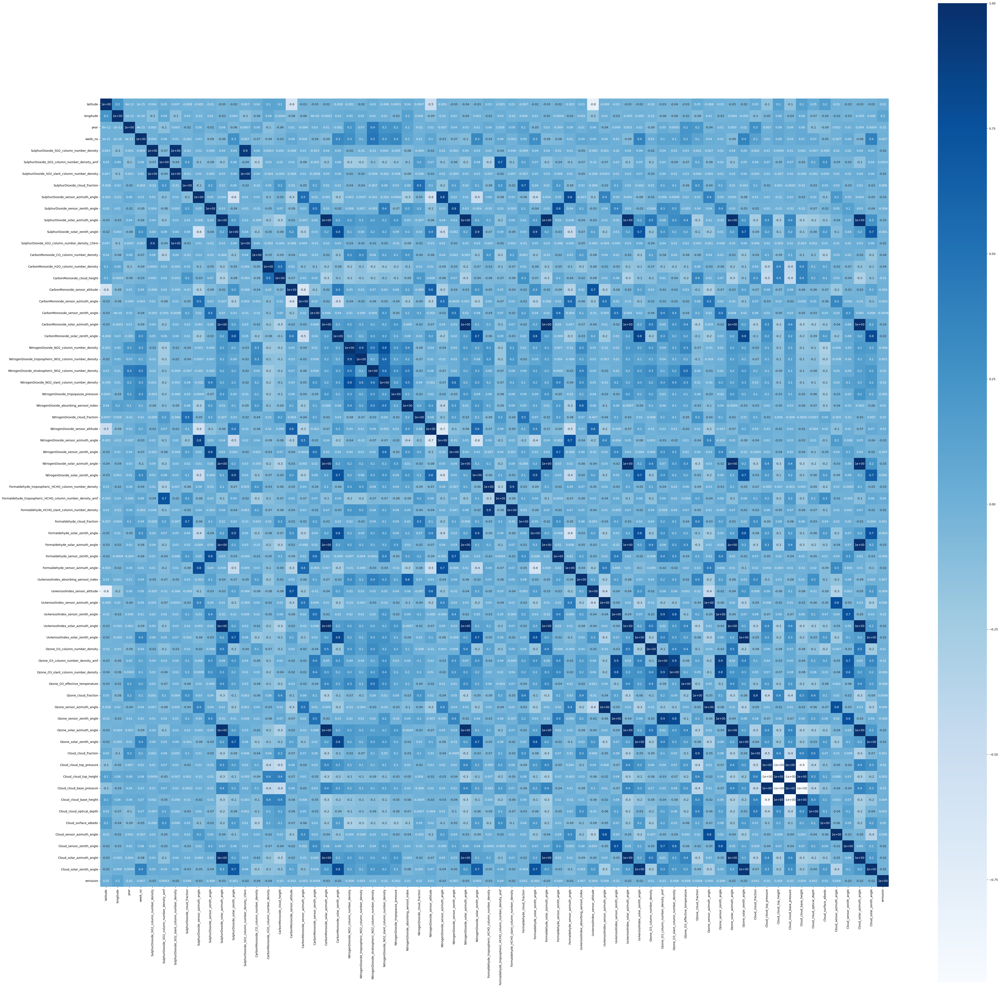

In [12]:
plt.figure(figsize=(60,60))
sns.heatmap(train.corr(), annot=True, square=True, fmt="0.1", cmap='Blues')

In [13]:
#Replace Nan value with median
def Fill_Data(data):
    for x in data.columns:
        data[x] = data[x].fillna(data[x].median())
    return data

train = Fill_Data(train)
test = Fill_Data(test)

In [14]:
train.shape

(79023, 68)

In [15]:
X = train.drop(columns="emission",axis=1)
Y = train["emission"]

x_train, x_test, y_train, y_test = train_test_split(X,Y, train_size=0.7, random_state=42)

In [16]:
X_sc = StandardScaler()
X_train = X_sc.fit_transform(x_train)

In [17]:
pca = PCA(n_components=3)
x_pca = pca.fit_transform(X)
x_train_pca, x_test_pca, y_train_pca, y_test_pca = train_test_split(x_pca, Y, train_size=0.7, random_state=42)

<div>
    <font size="20">
        Train Model
    </font>
</div>


<font size="5.5">Linear Regression</font>

In [18]:
model_LR = LinearRegression()
model_LR.fit(x_train,y_train)


print(f"training Score ==> {model_LR.score(x_train,y_train)}")
print(f"testing Score ==> {model_LR.score(x_test,y_test)}")




training Score ==> 0.027197611811500155
testing Score ==> 0.032213221497416344


In [19]:
model_LR_pca = LinearRegression()
model_LR_pca.fit(x_train_pca,y_train_pca)


print(f"training Score ==> {model_LR_pca.score(x_train_pca,y_train_pca)}")
print(f"testing Score ==> {model_LR_pca.score(x_test_pca,y_test_pca)}")

training Score ==> 0.0004531536295329097
testing Score ==> 0.0004205245442684413


In [20]:
predict_LR_pca = model_LR_pca.predict(x_test_pca)
print(predict_LR_pca)

[85.02035697 81.54693305 81.52414189 ... 75.83114954 84.5654558
 80.76266816]


<font size="5.5">Neural Network </font>

In [21]:
x_train.shape

(55316, 67)

<font size="5.5">Random Forest </font>

In [22]:
model_RF = RandomForestRegressor()
model_RF.fit(x_train,y_train)

print(f"The accuracy_score of training is ==> {model_RF.score(x_train, y_train)}")
print(f"The accuracy_score of testing is ==> {model_RF.score(x_test, y_test)}")

<font size="5.5">Decision Tree </font>

In [ ]:
model_DT = DecisionTreeRegressor()
model_DT.fit(x_train,y_train)


DecisionTreeRegressor(criterion='mse', max_depth=2)

print(f"The accuracy_score of training is ==> {model_DT.score(x_train, y_train)}")
print(f"The accuracy_score of testing is ==> {model_DT.score(x_test, y_test)}")

The accuracy_score of training is ==> 1.0
The accuracy_score of testing is ==> 0.9447508767166315


In [ ]:
y1 = model_DT.predict(x_test)



[113.57547   11.328578 230.52797  ...  28.090816  46.089848   0.      ]


    Compare Data with 2020 and without 2020
    Try to fix Neural Network
    Reduce the dimension of the Data
    